# EllipticCurves
$\newcommand{DS}{\displaystyle}$
$\newcommand{mbb}[1]{\mathbb{#1}}$
$\newcommand{set}[1]{\left\{ #1 \right\}}$
$\newcommand{sp}{\text{ }}$
$\newcommand{def}{\stackrel{def}=}$
$\newcommand{mc}[1]{\mathcal{#1}}$
$\newcommand{system}[1]{\begin{cases} #1 \end{cases}}$
$\newcommand{newline}{\\ \DS}$
## Def
**Elliptic curve** is a curve which is defined as follows:
$$
\DS
y^2+a_1xy+a_3y=x^3+a_2x^2+a_4x+a_5
$$
Elliptic curves can be defined over different fields(e.g. $\mbb{C},\mbb{Q},\mbb{F}_p,$etc.)

## Groups on elliptic curves
The group on elliptic curve is defined by intersection of an curve by line, the sum of points on this line is assumed to be $0$:
* $P+Q+R=0$
* $P+Q+Q=0$ (point in infinity)
* $P+Q+0=0$ (no point in infinity, line parallely to $Y$)
* $P+P+0=0$ (line has intersection only in one point)

## Def
**Modular group** is a group of linear fractional transform defined in upper half of complex plane:
$$
z\mapsto \frac{az+b}{cz+d}
$$

Where $ad-bc=1$

## Def 
**Special linear group** is a group of $n \times n$ matrices with determinant $1$:
$$
\DS
SL(n,\mbb{F})=(\set{A| A\in Mat_{n\times n}(\mbb{F}), det(A)=1},\times)
$$

## Def
**Prime ideal** of a ring $A$, is ideal $P$, s.t. $\forall r\in A: arb\in P\Rightarrow a\in P\lor b\in P$

## Def
**Weierstrass equation** is another form of elliptic curve that can be achieved by linear coordinate transformation. The generalized Wierstrass equation is as follows:
$$
\DS
y^2 = x^3+ax+b
$$
For elliptic curve to be non-singular, the RHS discriminant should not be $0$: $\Delta = -16(4a^3+27b^2) \ne 0$

## Th(Hasse)
[Statement(slide 11)](https://math.berkeley.edu/~ribet/parc.pdf)

Consider an equation (probably over field $\mbb{Z}$):
$$
\DS
y^2 = x^3+ax+b\sp mod\sp p
$$

Let $N_p$ be a number of solutions for this equation, then following holds:
$$
\DS
|N_p - p|<2\sqrt{p}
$$

## Def
[Statement+explanation(slide 19)](https://math.berkeley.edu/~ribet/parc.pdf)


**Conductor** is an integer such that its' divisors $p$ lead to singularity for an elliptic curve equation modulo $p$

## Def
**Endomorphism** is map(may not be invertible) of obaject into itself:
$$
\DS
f: V\to V
$$

## Def
**Isogeny** from elliptic curve $E_1$ to elliptic curve $E_2$ is a morphism $\phi: E_1 \to E_2$, s.t. $\phi(O)=O$. Isogenies are homomorphisms of elliptic curves over field $\mbb{F}$, denoted by $Hom_{\mbb{F}}(E_1,E_2)$

## Def
**Endomorphisms** of elliptic curve $E$:
$$
End_{\mbb{F}}(E) \def Hom_{\mbb{F}}(E,E)
$$

Endomorphisms of elliptic curve are ring.

## Def
Elliptic curve $E$ is said to have a **complex multiplication(CM)** if its ring of endomorphisms is strictly larger then ring of integers:
$$
\DS
End_{\mbb{C}}(E)\ne\mbb{Z}
$$

## Hasse-Weil $\zeta$-function for elliptic curves over $\mbb{Q}$


Source: [Wikipedia](https://en.wikipedia.org/wiki/Hasse%E2%80%93Weil_zeta_function)

Hasse-Weil $\zeta$-function extends Riemann $\zeta$-function on algebraic varaities. 

For elliptic curve $E$ with conductor $N$, Hasse-Weil $\zeta$-function is as follow:
$$
Z_{E,\mbb{Q}}(s) = \frac{\zeta(s)\zeta(s-1)}{L(s,E)}
$$

Where $L$ is $L$-function:<br>
$
\DS
L=\prod_{p} L_p(s,E)^{-1}
$


Where for prime $p$, $L_p$ is as follows:
<br>
$
\DS
L_p(s,E)=
\system{
    1-a_pp^{-s}+p^{1-2s}, \text{if } p \nmid N\\
    1-a_pp^{-s}, \text{if } p | N, p^2 \nmid N\\
    1, \text{if }p^2 | N
}
$

$a_p = p+1-\#E(\mbb{GF}_p)$ or $a_p = \pm 1$(for multiplicative reduction)

Where $\#E(\mbb{GF}_p)$ is an order of elliptic curve(i.e. number of points) over Galois field of size $p$.

In [1]:
from helpers import sload
from tqdm.notebook import *

In [2]:
def get_coefs(E_id: str, p_max: int, normalize = True):
    conductor = EllipticCurve(E_id).conductor()
    P = Primes()
    p = 2
    a = []
    while p<p_max:
        if conductor%p == 0:
            a.append(0)
            p = P.next(p)
            continue
        K = GF(p)    
        E = EllipticCurve(K, E_id)
        if normalize:
            a.append((p+1-E.order())/sqrt(p))
        else:
            a.append(p+1-E.order())
        p = P.next(p)
    return a
        

In [3]:
get_coefs("389a", 10, False)

[-2, -2, -3, -5]

In [4]:
EllipticCurve("389a").anlist(10)

[0, 1, -2, -2, 2, -3, 4, -5, 0, 1, 6]

In [5]:
def get_coefs_modular(E_id: list, p_max: int, normalize = True):
    E = EllipticCurve(E_id)
    conductor = E.conductor()
    _a = E.anlist(p_max)
    a=[]
    p = 2
    P = Primes()
    while p<p_max:
        if conductor%p != 0:
            if normalize:
                a.append(_a[p]/sqrt(p))
            else:
                a.append(_a[p])
        else:
            a.append(0)
        p = P.next(p)
    return a

def get_coefs_modular2(E: EllipticCurve,p_max: int, normalize = True):
    conductor = E.conductor()
    _a = E.anlist(p_max)
    a=[]
    p = 2
    P = Primes()
    while p<p_max:
        if conductor%p != 0:
            if normalize:
                a.append(_a[p]/sqrt(p))
            else:
                a.append(_a[p])
        else:
            a.append(0)
        p = P.next(p)
    return a

In [6]:
%%time
am = get_coefs_modular("389a",10000, False)

CPU times: user 31 ms, sys: 2.92 ms, total: 33.9 ms
Wall time: 39.6 ms


In [7]:
%%time
a = get_coefs("389a", 10000, False)

CPU times: user 5.63 s, sys: 125 ms, total: 5.75 s
Wall time: 5.91 s


In [8]:
am == a

True

**NOTE:** modular coefficients $a_p, p\in \mc{P}$(where $\mc{P}$ – prime numbers) will be always equal to coefficients computed in non-modular way due to [Modularity theorem(aka Taniyama-Weil-Shimura theorem)](https://en.wikipedia.org/wiki/Modularity_theorem)
## Building dataset of CM vs. non-CM curves

In [ ]:
DATASET_SIZE = 5000
P_MAX = 10000
NORMALIZE = True

In [ ]:
c = CremonaDatabase()
def find_cm():
    # We may have used LMFDB API for this(just
    # by using j-invariant filtering)
    # But better not to use any network stuff
    # since it may change rapidly
    cm = []
    start,stop = c.smallest_conductor(), c.largest_conductor()
    for conductor in tnrange(start,stop,1):
        for curve in c.curves(conductor):
            E = EllipticCurve(str(conductor)+curve)
            if E.has_cm():
                cm.append(str(conductor)+curve)
    return cm
cm = sload("cm.pi", find_cm)

In [ ]:
assert cm is not None
assert cm.__len__()>0
assert DATASET_SIZE>0

In [ ]:
non_cm_sz = DATASET_SIZE - cm.__len__()
_prop = float(cm.__len__())/float(DATASET_SIZE)
assert 0.3 < _prop and _prop < 0.7, "Imbalanced dataset!"

In [ ]:
def get_random_non_cm():
    curve = c.random()
    while curve.has_cm():
        curve = c.random()
    return curve
get_random_non_cm()

In [ ]:
D=[]
for i in tnrange(non_cm_sz):
    D.append(get_coefs_modular2(get_random_non_cm(), P_MAX, NORMALIZE)+[0])

In [ ]:
for i in tnrange(len(cm)):
    D.append(get_coefs_modular(cm[i], P_MAX, NORMALIZE)+[1])

In [ ]:
assert len(D) == DATASET_SIZE

In [ ]:
header = ""
P = Primes()
p = 2
n_as = 0
while p<P_MAX:
    header+="A"+str(p)+","
    p=P.next(p)
    n_as+=1
    
header += "CM\n"
n_as += 1


def line2csv(a: list):
    line = ""
    for i in range(len(a)):
        line += str(float(a[i]))
        if i != len(a) - 1:
            line += ","
    return line + "\n"

with open("output/dataset.csv", "w+") as f:
    f.write(header)
    for i in tnrange(len(D)):
        assert(len(D[i])==n_as)
        f.write(line2csv(D[i]))

## Def
**$j$-invariant** is a function which is defined on upper-half of a complex plane:
$$
\DS
\tau \in \mbb{C}, Im(\tau)>0
\newline
j(\tau)=1728\frac{g_2(\tau)}{\Delta(\tau)}
$$

Where:
* $\DS g_2(\tau) = 60 \sum_{(m,n)\ne (0,0)}(m+n\tau)^{-4}$
* $\DS g_3(\tau) = 140 \sum_{(m,n)\ne(0,0)}(m+n\tau)^{-6}$
* $\DS \Delta(\tau) = g_2(\tau)^3+27g_3(\tau)^2$

## Finding elliptic curves with same j-invariants and conductors

In [9]:
c = CremonaDatabase()

In [10]:
def dict2lists(d: dict):
    result = []
    for key in d.keys():
        if len(d[key])>1:
            result.append(d[key])
    return result

def find_same():
    # We may have used LMFDB API for this(just
    # by using j-invariant filtering)
    # But better not to use any network stuff
    # since it may change rapidly
    _same = []
    start,stop = c.smallest_conductor(), c.largest_conductor()
    for conductor in tnrange(start,stop,1):
        j_invariants = dict()
        flag = False
        for curve in c.curves(conductor):
            E = EllipticCurve(str(conductor)+curve)
            j = E.j_invariant()
            if j in j_invariants:
                j_invariants[j].append(str(conductor)+curve)
            else:
                j_invariants[j] = [str(conductor)+curve]
        _same += dict2lists(j_invariants)
    return _same

In [11]:
same = sload("same.pi",find_same)
same

  0%|          | 0/499997 [00:00<?, ?it/s]

[['54a1', '54b1'],
 ['96a1', '96b1'],
 ['99a1', '99c1'],
 ['128a1', '128b1', '128c1', '128d1'],
 ['135a1', '135b1'],
 ['147b1', '147c1'],
 ['150a1', '150b1'],
 ['153a1', '153d1'],
 ['160a1', '160b1'],
 ['175a1', '175c1'],
 ['189a1', '189d1'],
 ['192a1', '192b1'],
 ['192c1', '192d1'],
 ['196a1', '196b1'],
 ['200a1', '200e1'],
 ['200b1', '200d1'],
 ['216a1', '216d1'],
 ['216b1', '216c1'],
 ['224a1', '224b1'],
 ['225a1', '225b1'],
 ['234b1', '234c1'],
 ['242a1', '242b1'],
 ['243a1', '243b1'],
 ['245a1', '245b1'],
 ['256a1', '256d1'],
 ['256b1', '256c1'],
 ['270a1', '270c1'],
 ['288a1', '288d1', '288e1'],
 ['288b1', '288c1'],
 ['294a1', '294b1'],
 ['294d1', '294e1'],
 ['294f1', '294g1'],
 ['297a1', '297d1'],
 ['297b1', '297c1'],
 ['300a1', '300b1'],
 ['300c1', '300d1'],
 ['320a1', '320b1'],
 ['320c1', '320f1'],
 ['320d1', '320e1'],
 ['325a1', '325b1'],
 ['333b1', '333c1'],
 ['338a1', '338b1'],
 ['338d1', '338e1'],
 ['342d1', '342e1'],
 ['350b1', '350c1'],
 ['350e1', '350f1'],
 ['352a1', '3

In [12]:
len(same)

371362

371362? That's a lot. So lets verify that all list of curves here really have the same j-invariants and conductors:

In [13]:
for l in tqdm(same):
    E0 = EllipticCurve(l[0][:-1])
    conductor = E0.conductor()
    j = E0.j_invariant()
    for curve in l:
        E = EllipticCurve(curve[:-1])
        assert E.conductor()==conductor and E.j_invariant() == j

  0%|          | 0/371362 [00:00<?, ?it/s]

### Simple statistics

In [14]:
conductors = []
j_invariants = []
for group in tqdm(same):
    E = EllipticCurve(group[0][:-1])
    conductors.append(E.conductor())
    j_invariants.append(E.j_invariant())

  0%|          | 0/371362 [00:00<?, ?it/s]

In [49]:
X=conductors[:50000]
Y=j_invariants[:50000]
data=[]
for i in tnrange(len(X)):
    data.append([X[i],Y[i]])

  0%|          | 0/50000 [00:00<?, ?it/s]

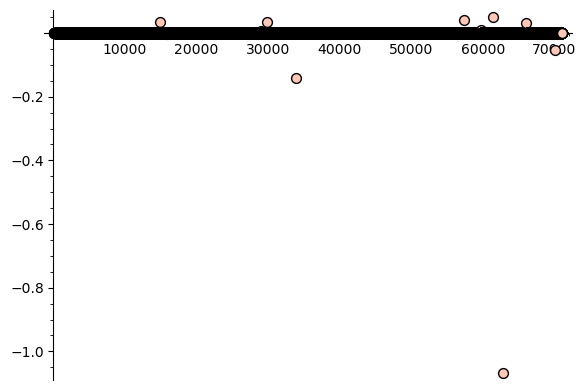

In [50]:
scatter_plot(data)

In [51]:
r.cor(X,Y)

[1] -0.005577325

In [52]:
X[-1]

71104